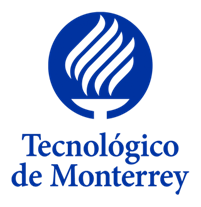

## Visión Computacional para imágenes y video (Gpo 10)
### Alumnos: 
* Armando Bringas Corpus - A01200230
* Guillermo Alfonso Muñiz Hermosillo - A01793101
* Jorge Luis Arroyo Chavelas - A01793023
* Samantha R Mancias Carrillo - A01196762
* Sofia E Mancias Carrillo - A01196563


### Profesores: 
* Dr. Gilberto Ochoa Ruiz
* Mtra. Yetnalezi Quintas Ruiz

# 5. Frequency Domain

## Table of Contents
1. [Libraries](#libraries)
2. [Fast Fourier Transform (FFT)](#fft)
3. [Low Pass Filter](#low)
4. [High Pass Filter](#high)
5. [Excercises](#excercises)

    a. [Low Pass Filter application](#lowpassfilter)
    
    b. [High Pass Filter application](#highpassfilter)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt,exp

## Fast Fourier Transform (FFT) <a class="anchor" id="fft" ></a>

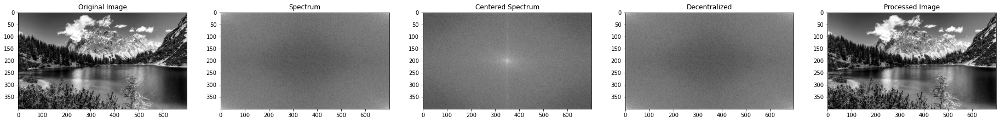

In [2]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

img = cv2.imread("data/image.jpg", 0)
plt.subplot(151), plt.imshow(img, "gray"), plt.title("Original Image")

original = np.fft.fft2(img)
plt.subplot(152), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

center = np.fft.fftshift(original)
plt.subplot(153), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

inv_center = np.fft.ifftshift(center)
plt.subplot(154), plt.imshow(np.log(1+np.abs(inv_center)), "gray"), plt.title("Decentralized")

processed_img = np.fft.ifft2(inv_center)
plt.subplot(155), plt.imshow(np.abs(processed_img), "gray"), plt.title("Processed Image")

plt.show()

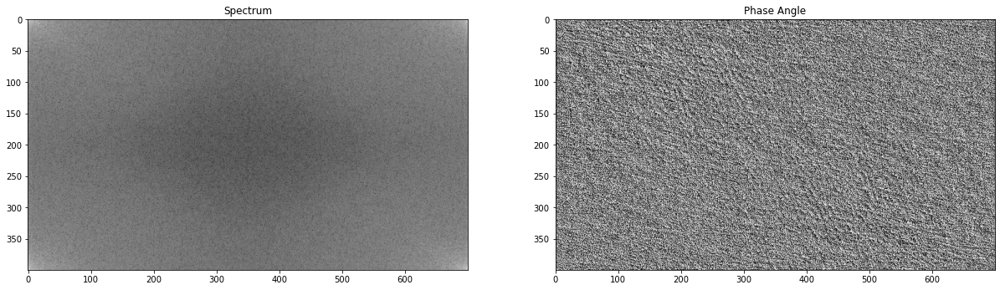

In [3]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

img = cv2.imread("data/image.jpg", 0)

original = np.fft.fft2(img)
plt.subplot(131), plt.imshow(np.log(np.abs(original)), "gray"), plt.title("Spectrum")

plt.subplot(132), plt.imshow(np.angle(original), "gray"), plt.title("Phase Angle")
plt.show()

In [4]:
def distance(point1,point2):
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def idealFilterLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 1
    return base

def idealFilterHP(D0,imgShape):
    base = np.ones(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 0
    return base

def butterworthLP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

def butterworthHP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1-1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

def gaussianLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

def gaussianHP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 - exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

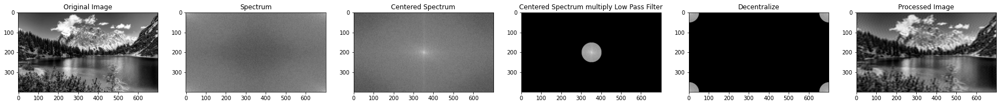

In [5]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

img = cv2.imread("data/image.jpg", 0)
plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

original = np.fft.fft2(img)
plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Spectrum")

center = np.fft.fftshift(original)
plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Centered Spectrum")

LowPassCenter = center * idealFilterLP(50,img.shape)
plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply Low Pass Filter")

LowPass = np.fft.ifftshift(LowPassCenter)
plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")

inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

plt.show()

## Low Pass Filter <a class="anchor" id="low" ></a>

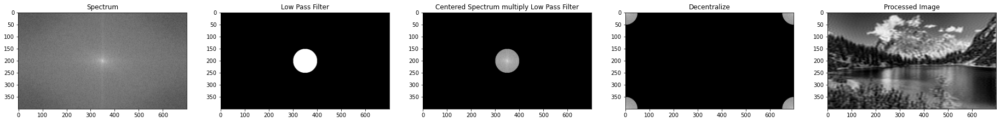

In [6]:
img = cv2.imread("data/image.jpg", 0)
original = np.fft.fft2(img)
center = np.fft.fftshift(original)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(151), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Spectrum")

LowPass = idealFilterLP(50,img.shape)
plt.subplot(152), plt.imshow(np.abs(LowPass), "gray"), plt.title("Low Pass Filter")

LowPassCenter = center * idealFilterLP(50,img.shape)
plt.subplot(153), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Centered Spectrum multiply Low Pass Filter")

LowPass = np.fft.ifftshift(LowPassCenter)
plt.subplot(154), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Decentralize")

inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(155), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Processed Image")

plt.show()

## High Pass Filter <a class="anchor" id="high" ></a>

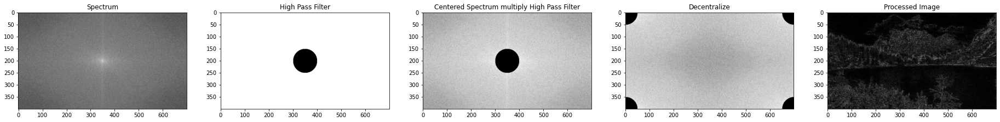

In [7]:
img = cv2.imread("data/image.jpg", 0)
original = np.fft.fft2(img)
center = np.fft.fftshift(original)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(151), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Spectrum")

HighPass = idealFilterHP(50,img.shape)
plt.subplot(152), plt.imshow(np.abs(HighPass), "gray"), plt.title("High Pass Filter")

HighPassCenter = center * idealFilterHP(50,img.shape)
plt.subplot(153), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Centered Spectrum multiply High Pass Filter")

HighPass = np.fft.ifftshift(HighPassCenter)
plt.subplot(154), plt.imshow(np.log(1+np.abs(HighPass)), "gray"), plt.title("Decentralize")

inverse_HighPass = np.fft.ifft2(HighPass)
plt.subplot(155), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Processed Image")

plt.show()

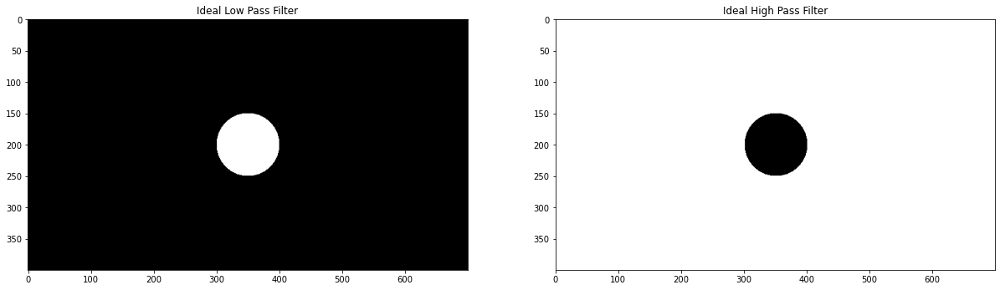

In [8]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

LowPass = idealFilterLP(50,img.shape)
plt.subplot(131), plt.imshow(LowPass, "gray"), plt.title("Ideal Low Pass Filter")

HighPass = idealFilterHP(50,img.shape)
plt.subplot(132), plt.imshow(HighPass, "gray"), plt.title("Ideal High Pass Filter")

plt.show()

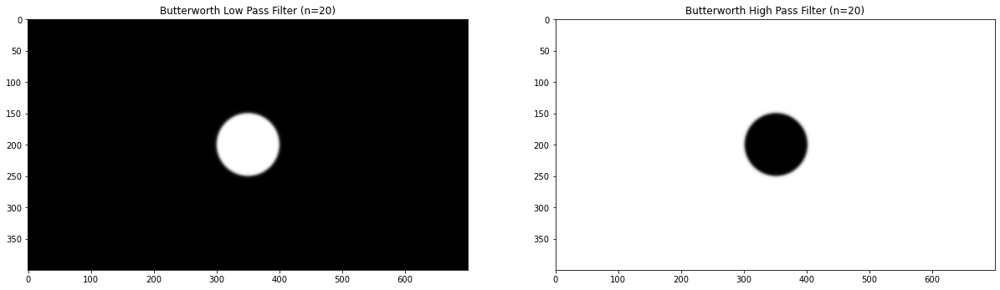

In [9]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

LowPass = butterworthLP(50,img.shape,20)
plt.subplot(131), plt.imshow(LowPass, "gray"), plt.title("Butterworth Low Pass Filter (n=20)")

HighPass = butterworthHP(50,img.shape,20)
plt.subplot(132), plt.imshow(HighPass, "gray"), plt.title("Butterworth High Pass Filter (n=20)")

plt.show()

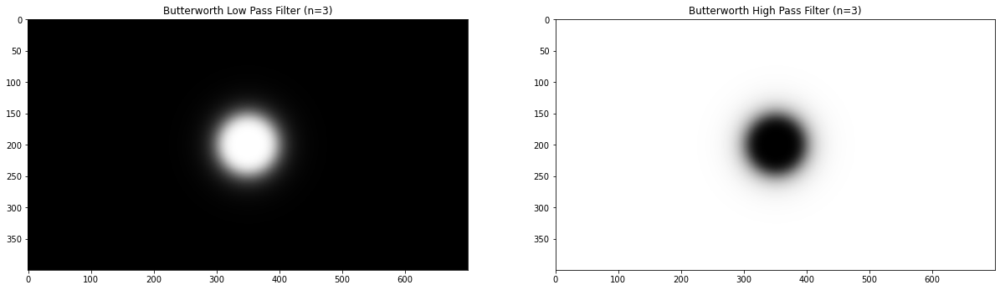

In [10]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

LowPass = butterworthLP(50,img.shape,3)
plt.subplot(131), plt.imshow(LowPass, "gray"), plt.title("Butterworth Low Pass Filter (n=3)")

HighPass = butterworthHP(50,img.shape,3)
plt.subplot(132), plt.imshow(HighPass, "gray"), plt.title("Butterworth High Pass Filter (n=3)")

plt.show()

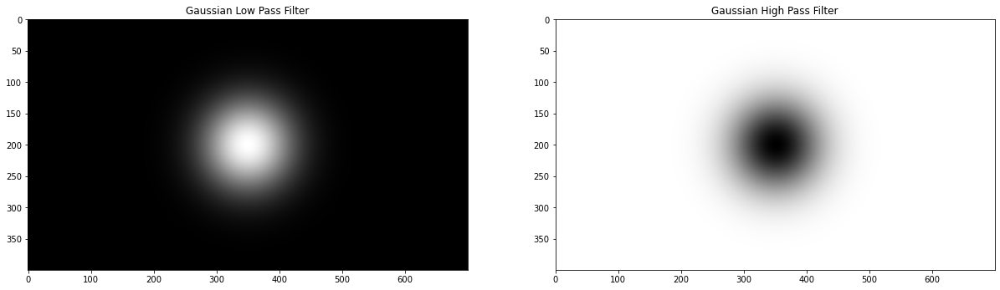

In [11]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

LowPass = gaussianLP(50,img.shape)
plt.subplot(131), plt.imshow(LowPass, "gray"), plt.title("Gaussian Low Pass Filter")

HighPass = gaussianHP(50,img.shape)
plt.subplot(132), plt.imshow(HighPass, "gray"), plt.title("Gaussian High Pass Filter")

plt.show()

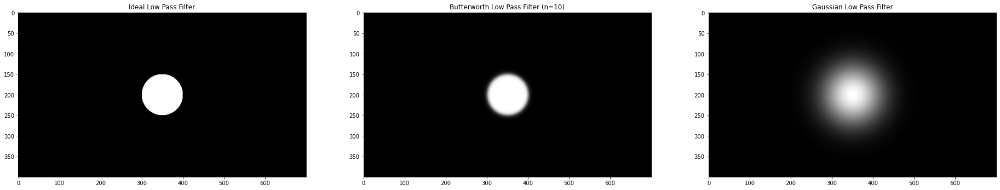

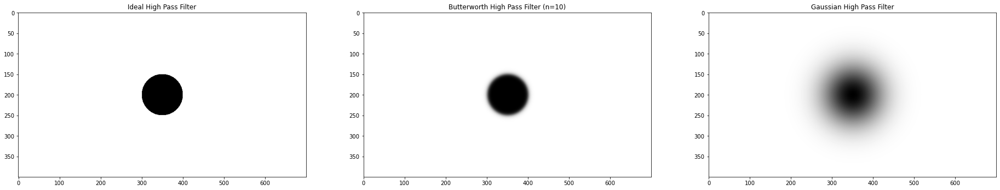

In [12]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

IdealLP = idealFilterLP(50,img.shape)
plt.subplot(131), plt.imshow(IdealLP, "gray"), plt.title("Ideal Low Pass Filter")

ButterLP = butterworthLP(50,img.shape,10)
plt.subplot(132), plt.imshow(ButterLP, "gray"), plt.title("Butterworth Low Pass Filter (n=10)")

GaussianLP = gaussianLP(50,img.shape)
plt.subplot(133), plt.imshow(GaussianLP, "gray"), plt.title("Gaussian Low Pass Filter")

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
IdealHP = idealFilterHP(50,img.shape)
plt.subplot(231), plt.imshow(IdealHP, "gray"), plt.title("Ideal High Pass Filter")

ButterHP = butterworthHP(50,img.shape,10)
plt.subplot(232), plt.imshow(ButterHP, "gray"), plt.title("Butterworth High Pass Filter (n=10)")

GaussianHP = gaussianHP(50,img.shape)
plt.subplot(233), plt.imshow(GaussianHP, "gray"), plt.title("Gaussian High Pass Filter")

plt.show()

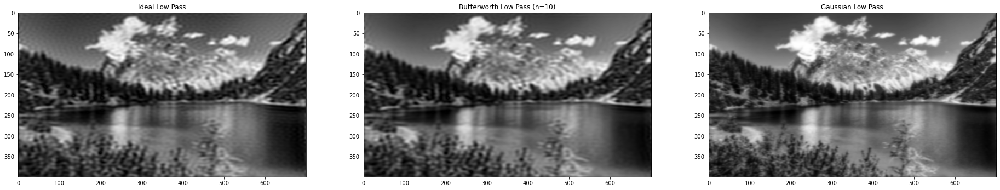

In [13]:
img = cv2.imread("data/image.jpg", 0)
original = np.fft.fft2(img)
center = np.fft.fftshift(original)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

LowPassCenter = center * idealFilterLP(50,img.shape)
LowPass = np.fft.ifftshift(LowPassCenter)
inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(131), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Ideal Low Pass")

LowPassCenter = center * butterworthLP(50,img.shape,10)
LowPass = np.fft.ifftshift(LowPassCenter)
inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(132), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Butterworth Low Pass (n=10)")

LowPassCenter = center * gaussianLP(50,img.shape)
LowPass = np.fft.ifftshift(LowPassCenter)
inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(133), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Gaussian Low Pass")

plt.show()

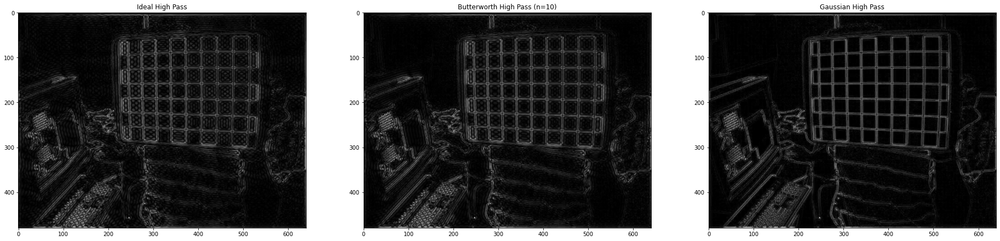

In [14]:
img = cv2.imread("data/left01.jpg", 0)
original = np.fft.fft2(img)
center = np.fft.fftshift(original)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

HighPassCenter = center * idealFilterHP(50,img.shape)
HighPass = np.fft.ifftshift(HighPassCenter)
inverse_HighPass = np.fft.ifft2(HighPass)
plt.subplot(131), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Ideal High Pass")

HighPassCenter = center * butterworthHP(50,img.shape,10)
HighPass = np.fft.ifftshift(HighPassCenter)
inverse_HighPass = np.fft.ifft2(HighPass)
plt.subplot(132), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Butterworth High Pass (n=10)")

HighPassCenter = center * gaussianHP(50,img.shape)
HighPass = np.fft.ifftshift(HighPassCenter)
inverse_HighPass = np.fft.ifft2(HighPass)
plt.subplot(133), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Gaussian High Pass")

plt.show()

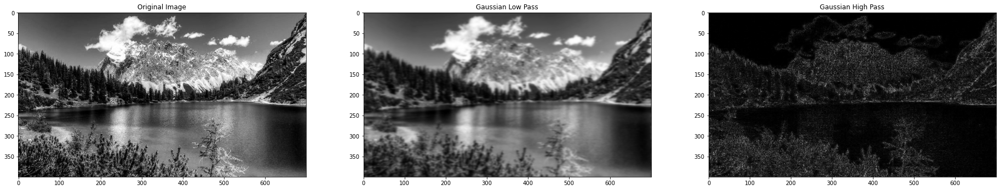

In [15]:
img = cv2.imread("data/image.jpg", 0)
original = np.fft.fft2(img)
center = np.fft.fftshift(original)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(131), plt.imshow(img, "gray"), plt.title("Original Image")

LowPassCenter = center * gaussianLP(50,img.shape)
LowPass = np.fft.ifftshift(LowPassCenter)
inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(132), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Gaussian Low Pass")

HighPassCenter = center * gaussianHP(50,img.shape)
HighPass = np.fft.ifftshift(HighPassCenter)
inverse_HighPass = np.fft.ifft2(HighPass)
plt.subplot(133), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Gaussian High Pass")

plt.show()

## Excercises <a class="anchor" id="excercises" ></a>

### a. Low Pass Filter application  <a class="anchor" id="lowpassfilter" ></a>
-- Here goes what it is --

In [16]:
#############################################
# Low Pass Filter Applications
#############################################

def lowPassFilters(img, D0=20, n=10):
    """
    Takes an image, and a distance D0 as well as an n for the exponentaial parameter of Buttlesworth.
    Returns a collection of images:
    Original Image / Fourier Spectrum
    Ideal Filter / Buttlesworth Filter / Gaussian Filter
    """

    def distance(point1, point2):
        """
        Returns the euclidean distance between two points.
        """
        return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

    def idealFilter(D0, imgShape):
        """
        It generates a zero matrix and change the values on a nested loop of the distance of each pixel on regads of the center.
        Rule is: preservation of pixels that are on a D0 distance from the center through a 1, remainders are 0.
        Tends to create ringins due to the abrupt attenuation of high frequency parts.
        """
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2, cols/2)
        for x in range(cols):
            for y in range(rows):
                if distance((y, x), center) < D0:
                    base[y, x] = 1
        return base

    def butterworth(D0, imgShape, n):
        """
        It generates a zero matrix and change the values on a nested loop of the distance of each pixel on regads of the center.
        Rule is: Reduces the intensity of pixels absed on their distance to D0, if distance is 0 is 1/1 on intensity
        As the distance expands the ratio 1/([1+D(u,v)/D0]2**n) tends to crete lower values, making a "blurred" middle circle
        with a smooth transition that relies heavily on the exponent n.
        """
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2, cols/2)
        for x in range(cols):
            for y in range(rows):
                base[y, x] = 1/(1+(distance((y, x), center)/D0)**(2*n))
        return base

    def gaussian(D0, imgShape):
        """
        It generates a zero matrix and change the values on a nested loop of the distance of each pixel on regads of the center.
        Rule is: Quite simmilar to Buttlesworth but it uses constant e by the power of an exponent that is based on the distance.
        Where e**0 == 1 and from them but this tends to decay by the exponent -(D**2(u,v)/2D0).
        This also makes a smoother transition between low and attunned high frequencies.
        """
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2, cols/2)
        for x in range(cols):
            for y in range(rows):
                base[y, x] = exp(((-distance((y, x), center)**2)/(2*(D0**2))))
        return base

    # Spectrum of provided image
    spectrum = np.fft.fftshift(np.fft.fft2(img))

    # Ideal filter mask
    LowPassCenter = spectrum * idealFilter(D0, img.shape)
    # Back from frequency
    LowPass = np.fft.ifftshift(LowPassCenter)
    inverse_LowPass = np.fft.ifft2(LowPass)

    # ButterWorth's filter mask
    LowPassCenter = spectrum * butterworth(D0, img.shape, n)
    # Back from frequency
    LowPass = np.fft.ifftshift(LowPassCenter)
    inverse_LowPass = np.fft.ifft2(LowPass)

    # Gaussian's filter mask
    LowPassCenter = spectrum * gaussian(D0, img.shape)
    # Back from Frequency
    LowPass = np.fft.ifftshift(LowPassCenter)
    inverse_LowPass = np.fft.ifft2(LowPass)

    # Plot images
    fig = plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
    plt.subplot(221), plt.imshow(np.abs(img), "gray"), plt.title("Original")
    plt.subplot(222), plt.imshow(np.abs(inverse_LowPass),"gray"), plt.title("Ideal Low Pass")
    plt.subplot(223), plt.imshow(np.abs(inverse_LowPass),"gray"), plt.title(f"Butterworth Low Pass (n={n})")
    plt.subplot(224), plt.imshow(np.abs(inverse_LowPass),"gray"), plt.title("Gaussian Low Pass")
    fig.suptitle(f"Low Pass FTT Filtering, using a distance to center of {D0} and an n of {n}", fontsize=22)
    plt.show()


-- Here we have how lopass is good to reduce noise --

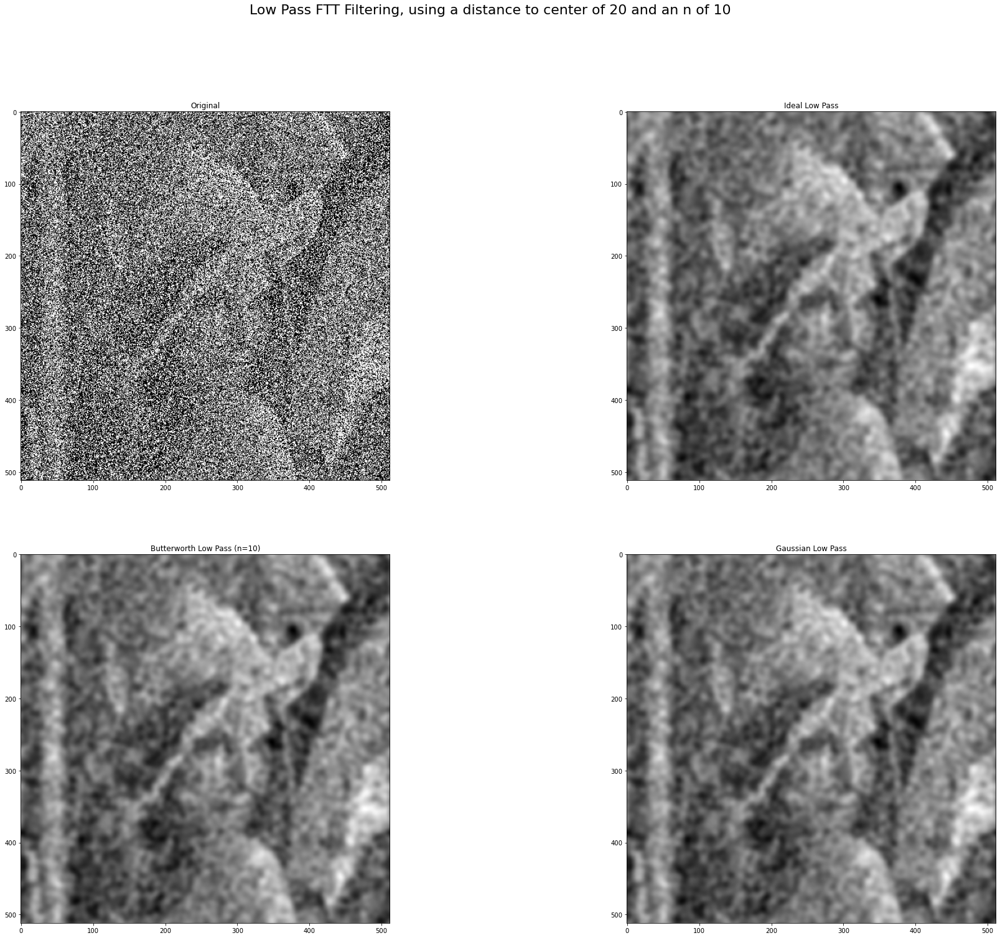

In [17]:
# Denoise application
img = cv2.imread("data/lena_supernoisy.jpg", 0)
lowPassFilters(img, D0=20, n=10)

-- Here we have a smooth application --

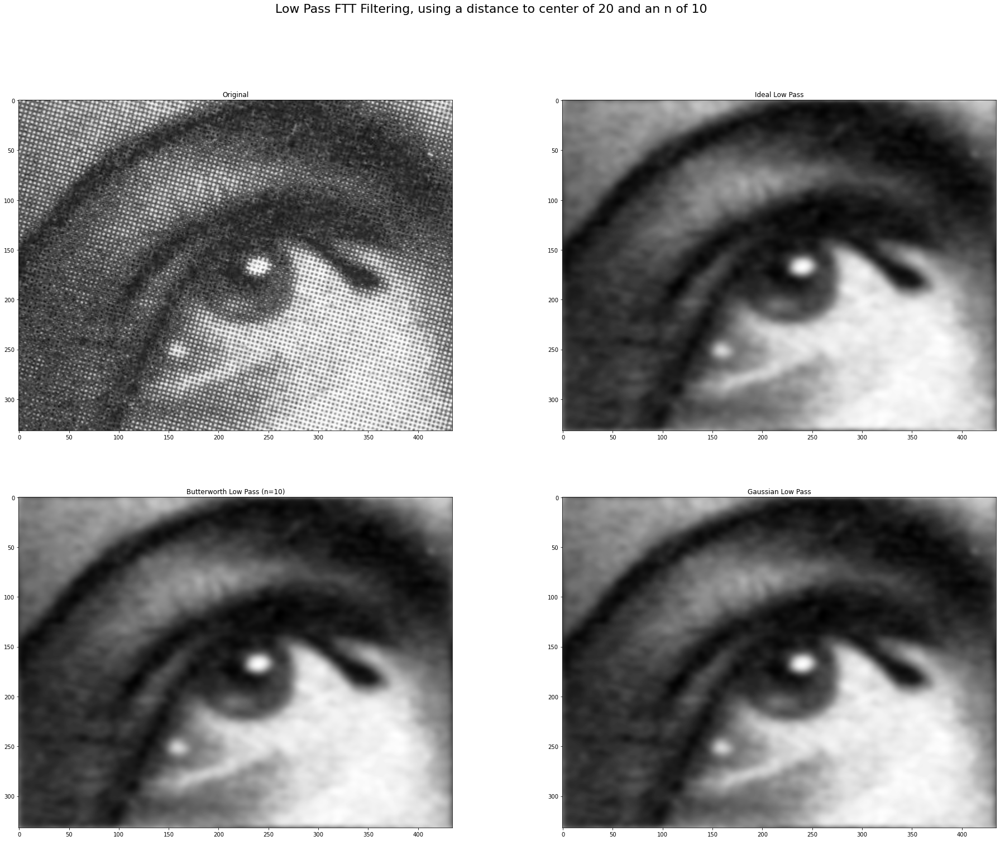

In [18]:
# Smooth application
img = cv2.imread("data/eye.jpg", 0)
lowPassFilters(img, D0=20, n=10)


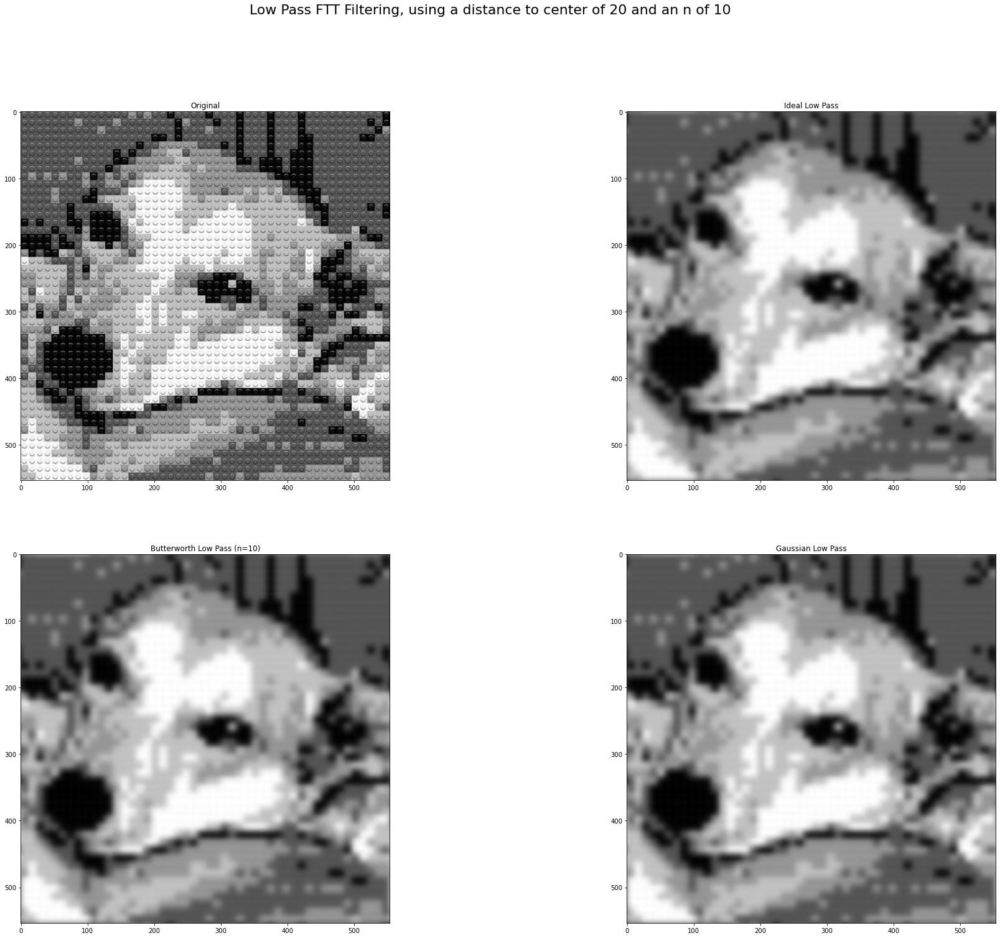

In [19]:
# Smooth application
img = cv2.imread("data/lego_perro.jpg", 0)
lowPassFilters(img, D0=20, n=10)


### b. High Pass Filter application  <a class="anchor" id="highpassfilter" ></a>

Some applications of a high-pass filter in the Fourier transform of an image are:

* Edge detection:
	
* Image denoising:
	
* Image sharpening:
	
* Image segmentation:
	
* Medical imaging:

In [20]:
#############################################
# High Pass Filter Applications
#############################################

def highPassFilters(img, D0=5, n=10, img_pos=[221, 222, 223, 224]):
    """
    Takes an image, and a distance D0 as well as an n for the exponentaial parameter of Buttlesworth.
    Returns a collection of images:
    Original Image / Fourier Spectrum
    Ideal Filter / Buttlesworth Filter / Gaussian Filter
    """

    def idealFilterHP(D0,imgShape):
        base = np.ones(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2,cols/2)
        for x in range(cols):
            for y in range(rows):
                if distance((y,x),center) < D0:
                    base[y,x] = 0
        return base

    def butterworthHP(D0,imgShape,n):
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2,cols/2)
        for x in range(cols):
            for y in range(rows):
                base[y,x] = 1-1/(1+(distance((y,x),center)/D0)**(2*n))
        return base

    def gaussianHP(D0,imgShape):
        base = np.zeros(imgShape[:2])
        rows, cols = imgShape[:2]
        center = (rows/2,cols/2)
        for x in range(cols):
            for y in range(rows):
                base[y,x] = 1 - exp(((-distance((y,x),center)**2)/(2*(D0**2))))
        return base

    original = np.fft.fft2(img)
    center = np.fft.fftshift(original)

    # Ideal Filter
    HighPassCenter = center * idealFilterHP(D0,img.shape)
    HighPass = np.fft.ifftshift(HighPassCenter)
    inverse_HighPass = np.fft.ifft2(HighPass)
    
    # Butterworth Filter
    HighPassCenter = center * butterworthHP(D0,img.shape,n)
    HighPass = np.fft.ifftshift(HighPassCenter)
    inverse_HighPass = np.fft.ifft2(HighPass)
    
    # Gaussian Filter
    HighPassCenter = center * gaussianHP(D0,img.shape)
    HighPass = np.fft.ifftshift(HighPassCenter)
    inverse_HighPass = np.fft.ifft2(HighPass)
   
    fig = plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
    plt.subplot(img_pos[0]), plt.imshow(np.abs(img), "gray"), plt.title("Original")
    plt.subplot(img_pos[1]), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Ideal High Pass")
    plt.subplot(img_pos[2]), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title(f"Butterworth High Pass (n={n})")
    plt.subplot(img_pos[3]), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Gaussian High Pass")
    fig.suptitle(f"High Pass FTT Filtering, using a distance to center of {D0} and an n of {n}", fontsize=22)
    plt.show()

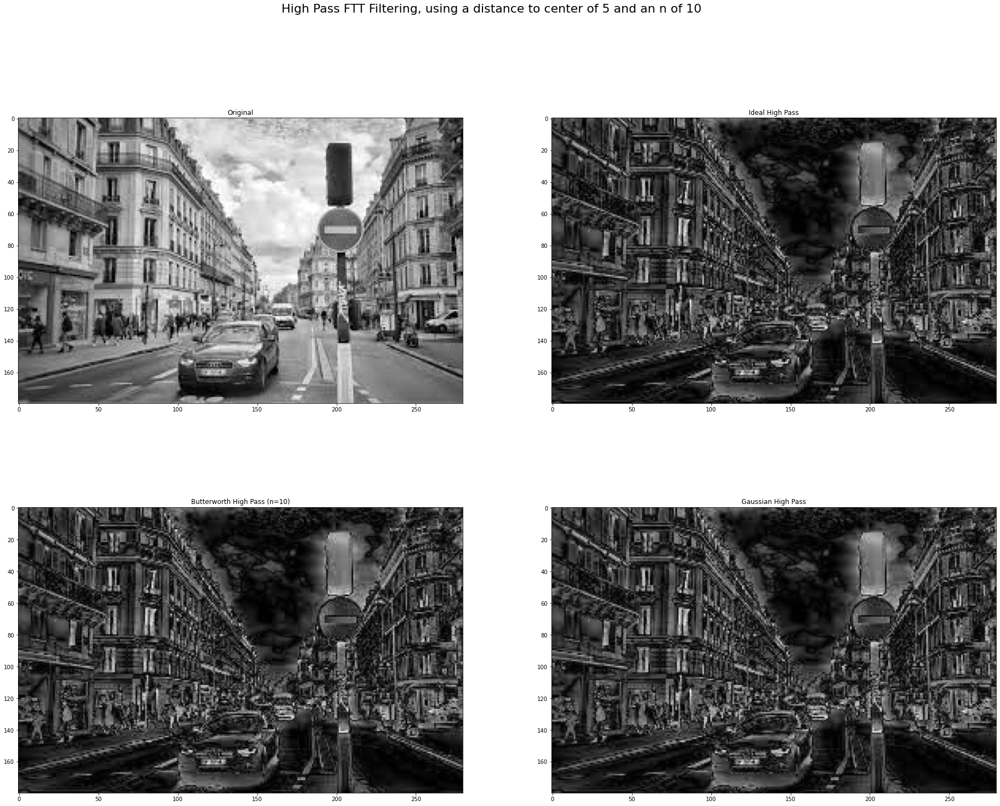

In [26]:
# Edge detection for ADAS applications
img = cv2.imread("data/road.jpeg", 0)
highPassFilters(img, 5, 10)

In our example we can see how through using a High Pass filter in the Fourier transform over an image taken from the road used for various Advanced Driver Assistance Systems (ADAS) applications. One of its most common applications is to sharpen the edges and details of the image, making it useful in computer vision tasks such as object detection and recognition.

High-pass filters in the Fourier domain function by removing the low-frequency components of an image and keeping the high-frequency components. The low-frequency components represent the smooth, uniform areas of the image while the high-frequency components represent the edges and details. By eliminating the low-frequency components and boosting the high-frequency components, a high-pass filter can improve the visibility of the edges and details, enhancing the performance of computer vision algorithms that rely on these features [1].

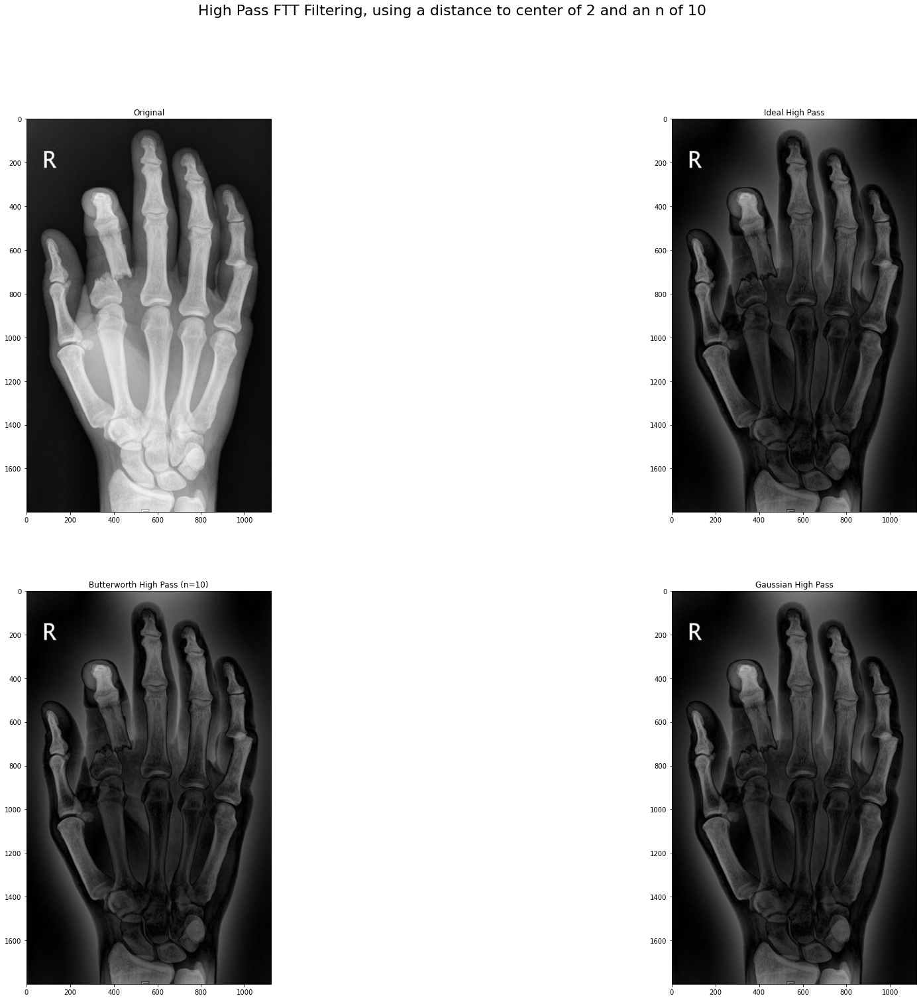

In [22]:
# Medical imaging application
img = cv2.imread("data/hand_xray.jpg", 0)
highPassFilters(img, 2, 10)

In our example we can see how through using a High Pass filter in the Fourier transform over an x-Ray image

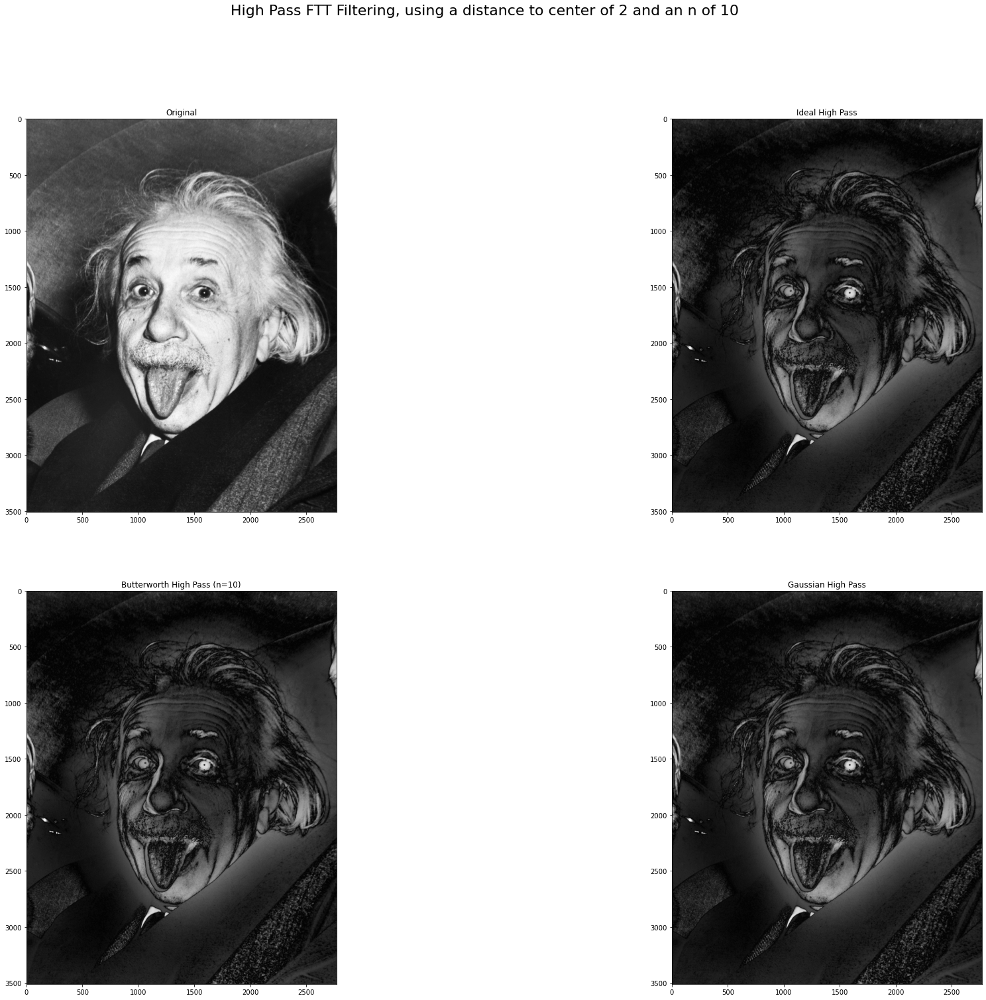

In [23]:
# For image sengmentation and fun
img = cv2.imread("data/albert.jpeg", 0)
highPassFilters(img, 2, 10)

### References

[1] Gonzalez, R. C., & Woods, R. E. (2008). Digital Image Processing (3rd ed.). Pearson Education.